In [1]:
import os

import numpy as np
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import tqdm

from data import BraTSDataset

from IPython.display import HTML

In [2]:
seed = 999
torch.manual_seed(seed)
np.random.seed(seed)

In [3]:
dataset_root = "dataset"
t1_train_data = "data/MICCAI_BraTS2020/train/t1"
image_size = 240
batch_size = 16
num_workers = 16
device = torch.device("cuda:0")

# Model hyperparameters
latent_size = 200

# Learning rate
lr = 0.0002
# beta 1 for Adam
beta1 = 0.5

# Number of training epochs
num_epochs = 50

In [4]:
image_paths = [os.path.join(t1_train_data, impath) for impath in os.listdir(t1_train_data)]
tf = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    ])
dataset = BraTSDataset(image_paths, tf)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

In [5]:
real_batch = next(iter(dataloader))

torch.Size([16, 1, 240, 240])


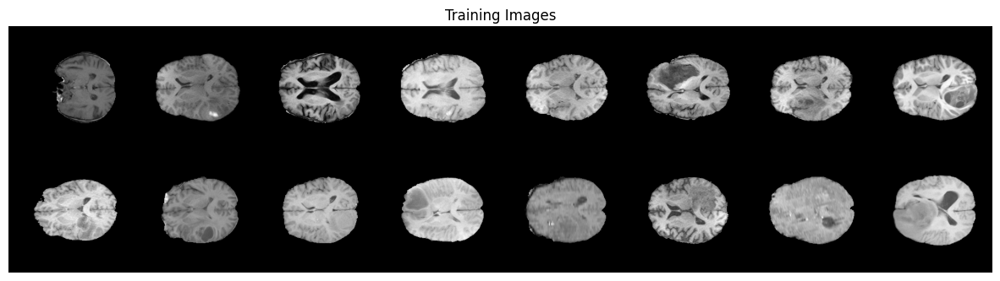

In [6]:
# Plot some training images
print(real_batch.shape)
# Actually plot it
plt.figure(figsize=(15, 15))
plt.axis("off")
plt.title("Training Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch.to(device)[:16], padding=2, normalize=True).cpu(),
        (1, 2, 0)
    )
)

In [7]:
def weight_init(m):
    """Custom weight initialization called on netG and netD"""
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.normal_(m.bias.data, 0)

In [8]:
# Generator code
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # state size: latent_size * 1 * 1
            nn.ConvTranspose2d(latent_size, 64, 4, 1, 0, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # state size: 64 * 4 * 4
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            # state size: 32 * 8 * 8
            nn.ConvTranspose2d(32, 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            # state size: 16 * 16 * 16
            nn.ConvTranspose2d(16, 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            # state size: 8 * 32 * 32
            nn.ConvTranspose2d(8, 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(4),
            nn.ReLU(True),
            # state size: 4 * 64 * 64
            nn.ConvTranspose2d(4, 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(2),
            nn.ReLU(True),
            # state size: 2 * 128 * 128
            nn.ConvTranspose2d(2, 1, 4, 2, 9, bias=False),
            nn.Tanh()
            # state size: 1 * 240 * 240
        )
    
    def forward(self, input):
        return self.main(input)

In [9]:
netG = Generator().to(device)
netG.apply(weight_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(200, 64, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(32, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(16, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(8, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNorm2d(4, eps=1e-05,

In [10]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # state size: 1 * 240 * 240
            nn.Conv2d(1, 2, 4, 2, 9, bias=False),
            nn.BatchNorm2d(2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 2 * 128 * 128
            nn.Conv2d(2, 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 4 * 64 * 64
            nn.Conv2d(4, 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 8 * 32 * 32
            nn.Conv2d(8, 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 16 * 16 * 16
            nn.Conv2d(16, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 32 * 8 * 8
            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 64 * 4 * 4
            nn.Conv2d(64, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # state size: 1 * 1 * 1
        )
    
    def forward(self, input):
        return self.main(input)

In [11]:
netD = Discriminator().to(device)
netD.apply(weight_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 2, kernel_size=(4, 4), stride=(2, 2), padding=(9, 9), bias=False)
    (1): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(2, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(4, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(8, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(16, 32, kernel_size=(4, 4), stride=(2,

In [12]:
critetion = nn.BCELoss()

fixed_noise = torch.randn(32, latent_size, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# Training loop

img_list = list()
G_losses = list()
D_losses = list()
best_g_loss = float("inf")
best_g_weights = None
best_d_weights = None

print("Staring training loop...")
print(f"Number of iteration per epoch: {len(dataloader)}")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in dataloader
    for i, data in tqdm(enumerate(dataloader, 0)):
        # Update D network
        # maximize log(D(x)) using batch of real images
        # maximize log(1 - D(G(z))) using batch of fake images

        # Train with real batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        if b_size != batch_size:
            # drop last batch
            continue
        netD.zero_grad()

        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = critetion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Train with fake batch
        noise = torch.randn(b_size, latent_size, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = critetion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake

        optimizerD.step()

        # Train generator: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = critetion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 24 == 0:
            tqdm.write("\n".join((
                f"epoch: {epoch}/{num_epochs}, iter: {i}/{len(dataloader)}, Loss D: {errD.item()}, Loss G: {errG.item()}",
                f"D_x: {D_x:.4f}, D_G_z1: {D_G_z1:.4f}, D_G_z2: {D_G_z2:.4f}"
            )))
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if G_losses[-1] < best_g_loss:
            best_g_weights = netG.state_dict()
            best_d_weights = netD.state_dict()
            best_g_loss = G_losses[-1]

        # Check how the generator is doing by saving G's output on fixed_noise
        if (i % 24 == 0 or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1))):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

Staring training loop...
Number of iteration per epoch: 24


0it [00:00, ?it/s]MIOpen(HIP): Warning [SQLiteBase] Missing system database file: gfx1030_14.kdb Performance may degrade. Please follow instructions to install: https://github.com/ROCmSoftwarePlatform/MIOpen#installing-miopen-kernels-package
0it [00:08, ?it/s]

epoch: 0/50, iter: 0/24, Loss D: 1.5786024332046509, Loss G: 0.842151939868927
D_x: 0.5159, D_G_z1: 0.5859, D_G_z2: 0.4385


24it [00:11,  2.11it/s]
0it [00:03, ?it/s]

epoch: 1/50, iter: 0/24, Loss D: 0.23487147688865662, Loss G: 2.554784059524536
D_x: 0.9039, D_G_z1: 0.1236, D_G_z2: 0.0802


24it [00:05,  4.68it/s]
0it [00:03, ?it/s]

epoch: 2/50, iter: 0/24, Loss D: 0.08010245114564896, Loss G: 3.4041004180908203
D_x: 0.9751, D_G_z1: 0.0529, D_G_z2: 0.0363


24it [00:06,  3.43it/s]
0it [00:03, ?it/s]

epoch: 3/50, iter: 0/24, Loss D: 0.10076820850372314, Loss G: 3.9573028087615967
D_x: 0.9422, D_G_z1: 0.0338, D_G_z2: 0.0214


24it [00:06,  3.62it/s]
3it [00:05,  1.37s/it]

epoch: 4/50, iter: 0/24, Loss D: 0.04268699139356613, Loss G: 4.213123321533203
D_x: 0.9818, D_G_z1: 0.0238, D_G_z2: 0.0153


24it [00:06,  3.54it/s]
0it [00:02, ?it/s]

epoch: 5/50, iter: 0/24, Loss D: 0.022504763677716255, Loss G: 4.826408386230469
D_x: 0.9893, D_G_z1: 0.0116, D_G_z2: 0.0084


24it [00:06,  3.52it/s]
0it [00:03, ?it/s]

epoch: 6/50, iter: 0/24, Loss D: 0.014473667368292809, Loss G: 5.092188835144043
D_x: 0.9953, D_G_z1: 0.0097, D_G_z2: 0.0069


24it [00:06,  3.49it/s]
0it [00:03, ?it/s]

epoch: 7/50, iter: 0/24, Loss D: 0.013423574157059193, Loss G: 5.349720001220703
D_x: 0.9946, D_G_z1: 0.0079, D_G_z2: 0.0051


24it [00:06,  3.58it/s]
0it [00:03, ?it/s]

epoch: 8/50, iter: 0/24, Loss D: 0.01957511156797409, Loss G: 5.208637237548828
D_x: 0.9878, D_G_z1: 0.0071, D_G_z2: 0.0058


24it [00:06,  3.60it/s]
0it [00:02, ?it/s]

epoch: 9/50, iter: 0/24, Loss D: 0.011447081342339516, Loss G: 5.325650215148926
D_x: 0.9957, D_G_z1: 0.0071, D_G_z2: 0.0053


24it [00:05,  4.76it/s]
3it [00:03,  1.11it/s]

epoch: 10/50, iter: 0/24, Loss D: 0.008487214334309101, Loss G: 6.030640602111816
D_x: 0.9951, D_G_z1: 0.0036, D_G_z2: 0.0027


24it [00:05,  4.68it/s]
3it [00:03,  1.05it/s]

epoch: 11/50, iter: 0/24, Loss D: 0.008746428415179253, Loss G: 5.873594284057617
D_x: 0.9954, D_G_z1: 0.0041, D_G_z2: 0.0034


24it [00:05,  4.58it/s]
1it [00:03,  3.34s/it]

epoch: 12/50, iter: 0/24, Loss D: 0.03965146094560623, Loss G: 3.4933576583862305
D_x: 0.9965, D_G_z1: 0.0353, D_G_z2: 0.0331


24it [00:05,  4.57it/s]
1it [00:03,  3.31s/it]

epoch: 13/50, iter: 0/24, Loss D: 0.02915038913488388, Loss G: 5.109447956085205
D_x: 0.9829, D_G_z1: 0.0115, D_G_z2: 0.0081


24it [00:05,  4.48it/s]
1it [00:03,  3.43s/it]

epoch: 14/50, iter: 0/24, Loss D: 0.017439480870962143, Loss G: 4.989738464355469
D_x: 0.9954, D_G_z1: 0.0127, D_G_z2: 0.0081


24it [00:05,  4.70it/s]
1it [00:03,  3.23s/it]

epoch: 15/50, iter: 0/24, Loss D: 0.010934141464531422, Loss G: 5.694445610046387
D_x: 0.9938, D_G_z1: 0.0046, D_G_z2: 0.0038


24it [00:05,  4.41it/s]
3it [00:03,  1.03it/s]

epoch: 16/50, iter: 0/24, Loss D: 0.04814055934548378, Loss G: 3.0553531646728516
D_x: 0.9609, D_G_z1: 0.0070, D_G_z2: 0.0512


24it [00:05,  4.56it/s]
3it [00:03,  1.03it/s]

epoch: 17/50, iter: 0/24, Loss D: 8.07267951965332, Loss G: 7.824761390686035
D_x: 0.0003, D_G_z1: 0.0000, D_G_z2: 0.0004


24it [00:05,  4.35it/s]
1it [00:03,  3.63s/it]

epoch: 18/50, iter: 0/24, Loss D: 0.46801453828811646, Loss G: 4.442241668701172
D_x: 0.9710, D_G_z1: 0.3423, D_G_z2: 0.0130


24it [00:05,  4.12it/s]
1it [00:03,  3.60s/it]

epoch: 19/50, iter: 0/24, Loss D: 0.3269466459751129, Loss G: 3.678589344024658
D_x: 0.7518, D_G_z1: 0.0097, D_G_z2: 0.0314


24it [00:05,  4.10it/s]
0it [00:03, ?it/s]

epoch: 20/50, iter: 0/24, Loss D: 0.6308321952819824, Loss G: 5.625760078430176
D_x: 0.9508, D_G_z1: 0.4301, D_G_z2: 0.0040


24it [00:06,  3.84it/s]
1it [00:04,  4.51s/it]

epoch: 21/50, iter: 0/24, Loss D: 0.3027389645576477, Loss G: 2.4208507537841797
D_x: 0.8450, D_G_z1: 0.1222, D_G_z2: 0.0943


24it [00:06,  3.48it/s]
0it [00:04, ?it/s]

epoch: 22/50, iter: 0/24, Loss D: 0.3386246860027313, Loss G: 4.959293842315674
D_x: 0.7321, D_G_z1: 0.0163, D_G_z2: 0.0073


24it [00:07,  3.12it/s]
0it [00:04, ?it/s]

epoch: 23/50, iter: 0/24, Loss D: 0.38112321496009827, Loss G: 3.8235387802124023
D_x: 0.9612, D_G_z1: 0.2840, D_G_z2: 0.0231


24it [00:07,  3.13it/s]
1it [00:04,  4.93s/it]

epoch: 24/50, iter: 0/24, Loss D: 0.1911148726940155, Loss G: 3.7162561416625977
D_x: 0.8711, D_G_z1: 0.0447, D_G_z2: 0.0280


24it [00:07,  3.09it/s]
1it [00:05,  5.11s/it]

epoch: 25/50, iter: 0/24, Loss D: 0.5436322689056396, Loss G: 3.0791895389556885
D_x: 0.8141, D_G_z1: 0.2708, D_G_z2: 0.0492


24it [00:07,  3.02it/s]
0it [00:05, ?it/s]

epoch: 26/50, iter: 0/24, Loss D: 0.24384155869483948, Loss G: 3.6923341751098633
D_x: 0.9462, D_G_z1: 0.1675, D_G_z2: 0.0282


24it [00:08,  2.81it/s]
1it [00:05,  5.46s/it]

epoch: 27/50, iter: 0/24, Loss D: 1.9295742511749268, Loss G: 3.8910062313079834
D_x: 0.9874, D_G_z1: 0.8233, D_G_z2: 0.0229


24it [00:08,  2.79it/s]
1it [00:05,  5.73s/it]

epoch: 28/50, iter: 0/24, Loss D: 0.7750455141067505, Loss G: 2.886399984359741
D_x: 0.5433, D_G_z1: 0.0721, D_G_z2: 0.0583


24it [00:08,  2.79it/s]
0it [00:05, ?it/s]

epoch: 29/50, iter: 0/24, Loss D: 0.1570211499929428, Loss G: 2.827517509460449
D_x: 0.8973, D_G_z1: 0.0444, D_G_z2: 0.0623


24it [00:08,  2.67it/s]
2it [00:06,  2.65s/it]

epoch: 30/50, iter: 0/24, Loss D: 0.2372550517320633, Loss G: 2.8769922256469727
D_x: 0.8448, D_G_z1: 0.0398, D_G_z2: 0.0587


24it [00:09,  2.57it/s]
2it [00:07,  3.05s/it]

epoch: 31/50, iter: 0/24, Loss D: 1.2330234050750732, Loss G: 3.870169162750244
D_x: 0.8848, D_G_z1: 0.6554, D_G_z2: 0.0221


24it [00:10,  2.19it/s]
0it [00:06, ?it/s]

epoch: 32/50, iter: 0/24, Loss D: 1.7308275699615479, Loss G: 4.629265785217285
D_x: 0.9563, D_G_z1: 0.8058, D_G_z2: 0.0103


24it [00:10,  2.27it/s]
0it [00:06, ?it/s]

epoch: 33/50, iter: 0/24, Loss D: 0.9344593286514282, Loss G: 0.8768153190612793
D_x: 0.5499, D_G_z1: 0.2442, D_G_z2: 0.4227


24it [00:11,  2.14it/s]
0it [00:07, ?it/s]

epoch: 34/50, iter: 0/24, Loss D: 0.29206398129463196, Loss G: 2.5851898193359375
D_x: 0.7984, D_G_z1: 0.0502, D_G_z2: 0.0835


24it [00:11,  2.01it/s]
1it [00:08,  8.30s/it]

epoch: 35/50, iter: 0/24, Loss D: 0.807145357131958, Loss G: 1.4991028308868408
D_x: 0.6179, D_G_z1: 0.2053, D_G_z2: 0.2275


24it [00:12,  1.88it/s]
2it [00:08,  3.58s/it]

epoch: 36/50, iter: 0/24, Loss D: 0.6151424050331116, Loss G: 1.9619786739349365
D_x: 0.7578, D_G_z1: 0.2779, D_G_z2: 0.1417


24it [00:13,  1.83it/s]
1it [00:09,  9.03s/it]

epoch: 37/50, iter: 0/24, Loss D: 1.082747459411621, Loss G: 3.2427620887756348
D_x: 0.8970, D_G_z1: 0.6118, D_G_z2: 0.0395


24it [00:13,  1.72it/s]
1it [00:09,  9.74s/it]

epoch: 38/50, iter: 0/24, Loss D: 0.7445677518844604, Loss G: 1.5602558851242065
D_x: 0.6109, D_G_z1: 0.1789, D_G_z2: 0.2156


24it [00:15,  1.55it/s]
0it [00:10, ?it/s]

epoch: 39/50, iter: 0/24, Loss D: 0.6419318914413452, Loss G: 2.19058895111084
D_x: 0.7801, D_G_z1: 0.3123, D_G_z2: 0.1146


24it [00:18,  1.33it/s]
0it [00:13, ?it/s]

epoch: 40/50, iter: 0/24, Loss D: 0.7920129299163818, Loss G: 2.6827030181884766
D_x: 0.8479, D_G_z1: 0.4556, D_G_z2: 0.0703


24it [00:22,  1.07it/s]
1it [00:15, 15.63s/it]

epoch: 41/50, iter: 0/24, Loss D: 1.2002187967300415, Loss G: 0.5974124073982239
D_x: 0.3453, D_G_z1: 0.0559, D_G_z2: 0.5583


24it [00:24,  1.02s/it]
0it [00:15, ?it/s]

epoch: 42/50, iter: 0/24, Loss D: 1.0623644590377808, Loss G: 2.5807204246520996
D_x: 0.8474, D_G_z1: 0.5815, D_G_z2: 0.0782


24it [00:27,  1.17s/it]
0it [00:16, ?it/s]

epoch: 43/50, iter: 0/24, Loss D: 2.213090181350708, Loss G: 1.672642707824707
D_x: 0.9797, D_G_z1: 0.8824, D_G_z2: 0.1959


24it [00:29,  1.24s/it]
0it [00:18, ?it/s]

epoch: 44/50, iter: 0/24, Loss D: 0.46237239241600037, Loss G: 2.106381893157959
D_x: 0.7186, D_G_z1: 0.1090, D_G_z2: 0.1285


24it [00:31,  1.31s/it]
0it [00:17, ?it/s]

epoch: 45/50, iter: 0/24, Loss D: 0.6829139590263367, Loss G: 0.1468258798122406
D_x: 0.5457, D_G_z1: 0.0284, D_G_z2: 0.8650


24it [00:31,  1.30s/it]
0it [00:18, ?it/s]

epoch: 46/50, iter: 0/24, Loss D: 1.3175791501998901, Loss G: 0.7140239477157593
D_x: 0.4796, D_G_z1: 0.3842, D_G_z2: 0.4938


24it [00:32,  1.36s/it]
0it [00:18, ?it/s]

epoch: 47/50, iter: 0/24, Loss D: 0.864408016204834, Loss G: 1.818873405456543
D_x: 0.6823, D_G_z1: 0.3708, D_G_z2: 0.1653


24it [00:34,  1.42s/it]
0it [00:15, ?it/s]

epoch: 48/50, iter: 0/24, Loss D: 0.43162620067596436, Loss G: 2.848458766937256
D_x: 0.8159, D_G_z1: 0.1920, D_G_z2: 0.0600


24it [00:35,  1.47s/it]
0it [00:20, ?it/s]

epoch: 49/50, iter: 0/24, Loss D: 0.8484811782836914, Loss G: 4.278122425079346
D_x: 0.9160, D_G_z1: 0.5180, D_G_z2: 0.0154


24it [00:34,  1.45s/it]


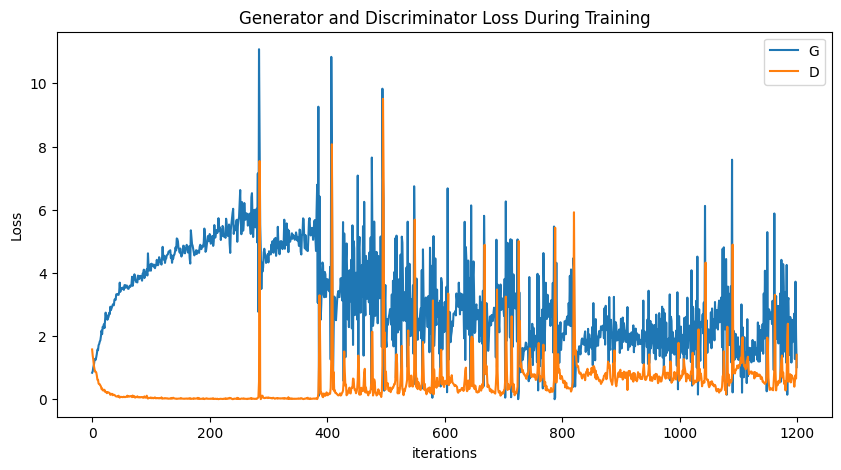

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

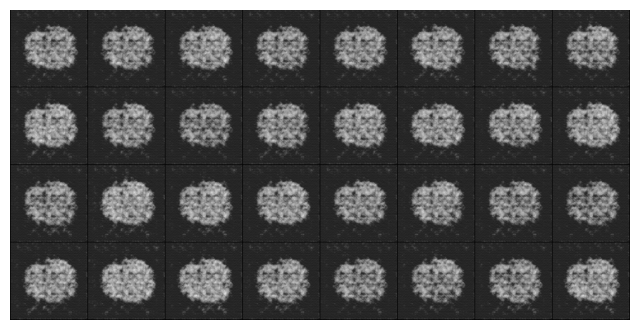

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[-50:]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [16]:
# Save models weights
# model dir should be models/dcgan_hr_mm_dd_mm
model_dir = "models/dcgan_18_42_29_11"
torch.save(best_d_weights, f"{model_dir}/discriminator.pth")
torch.save(best_g_weights, f"{model_dir}/generator.pth")

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 2, kernel_size=(4, 4), stride=(2, 2), padding=(9, 9), bias=False)
    (1): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(2, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(4, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(8, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(16, 32, kernel_size=(4, 4), stride=(2,

(-0.5, 1937.5, 485.5, -0.5)

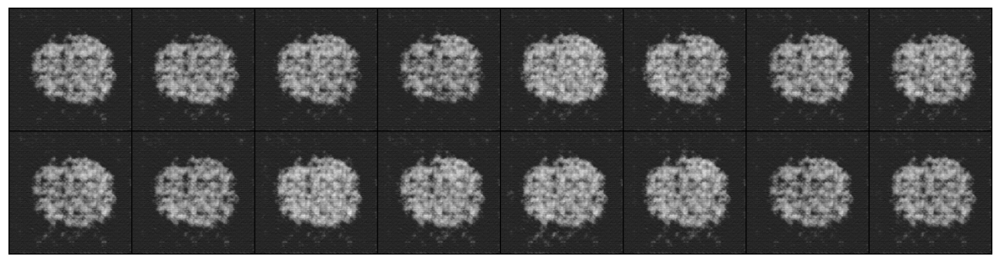

In [17]:
# model dir should be models/dcgan_hr_mm_dd_mm
model_dir = "models/dcgan_18_42_29_11"

# Load model and perform inference
netD = Discriminator().to(device)
netD.apply(weight_init)
print(netD)

netG = Generator().to(device)
netG.apply(weight_init)
print(netG)

netD.load_state_dict(torch.load(f"{model_dir}/discriminator.pth"))
netG.load_state_dict(torch.load(f"{model_dir}/generator.pth"))

netG.eval()

fixed_noise = torch.randn(16, latent_size, 1, 1, device=device)

fake = netG(fixed_noise).detach().cpu()

plt.figure(figsize=(15, 15))
plt.imshow(
    np.transpose(
        vutils.make_grid(fake, padding=2, normalize=True),
        (1, 2, 0)
    )
)
plt.axis("off")